# Bounding box comparision

Instructions:

i) Folder of test input images and test input labelled images should be in the same folder with this code file and folder name should be 'val' and 'val_labels" respectively but you can change the name in the data loading section.

Run the codes sequentially and you will get the ouput

Note:
i) If you are training for kvasir seg lood weights = chal1.pth 
ii)



In [1]:
size = 400

In [2]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
import torchvision
from torchvision import transforms
import torch.optim as optim
import matplotlib.pyplot as plt
import cv2 

In [3]:
# Convert the output labels to pixel-wise classes

def c2g(cn):
    cn1 = np.reshape(cn, (1, 1, 3));
    cn = cv2.cvtColor(cn1, cv2.COLOR_BGR2GRAY);
    del cn1
    return cn;

colors = [];
colors.append(c2g(np.array([0, 0, 0], dtype = 'uint8')));
colors.append(c2g(np.array([255, 255, 255], dtype = 'uint8')));

# colors.append(c2g(np.array([0, 0, 0], dtype = 'uint8')));

import torch
from PIL import Image
from torch import Tensor
from torchvision.transforms import transforms
import torchvision.transforms.functional as F

import numpy as np
import matplotlib
import matplotlib.pyplot as plt

import numbers
from abc import abstractmethod
from typing import Tuple
import random


# 

def class_pixel(label_img):
    # print(label_img.shape)
    
    aa,bb = label_img.shape

    
    class_pix = np.ones([aa, bb, 1], dtype = int);
    for index, c in enumerate(colors):
        
        class_pix[label_img == c] = index; 
    # print(class_pix)
    

    return class_pix
def label_img_list(img_list):
    images = [];
    for image in img_list:
        images.append(class_pixel(image));
    del img_list
    return images;


# Data Loading

In [4]:
# FOR VALIDATION

import os

# To load images

def loads_img(folder):
    c = 0;
    images = [];
    filenam =[];
    for filename in os.listdir(folder): # List all the filenames in the folde
        print('nwname ',filename)
        c = c + 1;
        print(c);
        img = cv2.imread(os.path.join(folder, filename)); 
        img = cv2.resize(img, (size,size))
        images.append(img);
        del img

    return images

# To load labeled gray-scaled images

def loads_label_img(folder):
    images = [];
    c = 0;
    for filename in os.listdir(folder): # List all the filenames in the folder
        c = c + 1;
        print(c)
        img = cv2.imread(os.path.join(folder, filename));
       
        images.append(img);
        del img
        


    return images

def matplotlib_imshow(display_list):
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.imshow(display_list[i])
        plt.axis('off')
    plt.show()

transform_img = transforms.Compose([ 
    transforms.ToTensor()]);
    

transform_img_label = transforms.Compose([
    transforms.ToTensor()
]);

from torch.utils.data import Dataset, DataLoader


    
class testsett(data.Dataset):
    def __init__(self, transform = None, root_test = None, root_test_label = None, transform_label = None):
        self.test_img= loads_img(root_test);
        self.transform = transform;
        self.test_label_img = loads_label_img(root_test_label);
        
    def __len__(self):
        return len(self.test_img);
    
    def __getitem__(self, index):
        img = self.transform(self.test_img[index]);
        label = self.test_label_img[index];
#         name = self.name[index]
        img2 = self.test_img[index];

        return img, label,img2;


testdatasets = testsett(transform_img, 'val', 'val_labels', transform_img_label);

val_loader = data.DataLoader(testdatasets, batch_size = 1, shuffle=False,  num_workers=0);

nwname  ckcu8ty6z00003b5yzfaezbs5.jpg
1
nwname  ckcu8v7pr00013b5ymfi2z7uf.jpg
2
nwname  ckcu8w7vy00023b5y3vt2wczx.jpg
3
nwname  ckcu8xad600033b5yc78xfyjx.jpg
4
nwname  ckcu99qx200043b5yd2c5g84t.jpg
5
nwname  ckcu9ejjf00053b5y4mf7bilw.jpg
6
nwname  ckcu9ij2e00063b5yrrbb3f2o.jpg
7
nwname  ckcu9j9vo00073b5y3m92mu6n.jpg
8
nwname  ckcu9jucf00083b5ytpqoue72.jpg
9
nwname  ckcu9ksoq00093b5ylw5wwfr2.jpg
10
nwname  ckcu9lvft000a3b5yb79pnr64.jpg
11
nwname  ckcu9mtrc000b3b5y826amhgq.jpg
12
nwname  ckcu9newl000c3b5ynkam0whb.jpg
13
nwname  ckcu9qend000d3b5y0mgn5fhw.jpg
14
nwname  ckcu9r72l000e3b5yerhwmjut.jpg
15
nwname  ckcu9ru1s000f3b5yi4748k4m.jpg
16
nwname  ckcu9sikm000g3b5y1yd89b1g.jpg
17
nwname  ckcu9t8au000h3b5y7l82d9jh.jpg
18
nwname  ckcu9tscz000i3b5yqgmkln7u.jpg
19
nwname  ckcu9vda7000k3b5yh7a2gh5v.jpg
20
nwname  ckcu9w0ls000l3b5yfqcnpqny.jpg
21
nwname  ckcu9xaug000n3b5y480n145d.jpg
22
nwname  ckcu9yqhb000o3b5y5o6idona.jpg
23
nwname  ckcu9zqev000p3b5ylwdnm6e8.jpg
24
nwname  ckcua0dkl000q3b5y

# Model 

In [5]:
import torch
from torch import nn
from torch.nn import functional as F

from numpy.linalg import svd
from numpy.random import normal
from math import sqrt
import torchvision.models as models

import torch
import torch.nn as nn
import torch.nn.functional as F
from network.utils import IntermediateLayerGetter
from network._deeplab import DeepLabHead, DeepLabHeadV3Plus, DeepLabV3
from network.backbone import resnet
from network.backbone import mobilenetv2

def _segm_resnet(name, backbone_name, num_classes, output_stride, pretrained_backbone):

    if output_stride==8:
        replace_stride_with_dilation=[False, True, True]
        aspp_dilate = [12, 24, 36]
    else:
        replace_stride_with_dilation=[False, False, True]
        aspp_dilate = [6, 12, 18]

    backbone = resnet.__dict__[backbone_name](
        pretrained=pretrained_backbone,
        replace_stride_with_dilation=replace_stride_with_dilation)
    
    inplanes = 2048
    low_level_planes = 256

    if name=='deeplabv3plus':
        return_layers = {'layer4': 'out', 'layer1': 'low_level'}
        classifier = DeepLabHeadV3Plus(inplanes, low_level_planes, num_classes, aspp_dilate)
    elif name=='deeplabv3':
        return_layers = {'layer4': 'out'}
        classifier = DeepLabHead(inplanes , num_classes, aspp_dilate)
    backbone = IntermediateLayerGetter(backbone, return_layers=return_layers)

    model = DeepLabV3(backbone, classifier)
    return model

def _segm_mobilenet(name, backbone_name, num_classes, output_stride, pretrained_backbone):
    if output_stride==8:
        aspp_dilate = [12, 24, 36]
    else:
        aspp_dilate = [6, 12, 18]

    backbone = mobilenetv2.mobilenet_v2(pretrained=pretrained_backbone, output_stride=output_stride)
    
    # rename layers
    backbone.low_level_features = backbone.features[0:4]
    backbone.high_level_features = backbone.features[4:-1]
    backbone.features = None
    backbone.classifier = None

    inplanes = 320
    low_level_planes = 24
    
    if name=='deeplabv3plus':
        return_layers = {'high_level_features': 'out', 'low_level_features': 'low_level'}
        classifier = DeepLabHeadV3Plus(inplanes, low_level_planes, num_classes, aspp_dilate)
    elif name=='deeplabv3':
        return_layers = {'high_level_features': 'out'}
        classifier = DeepLabHead(inplanes , num_classes, aspp_dilate)
    backbone = IntermediateLayerGetter(backbone, return_layers=return_layers)

    model = DeepLabV3(backbone, classifier)
    return model

def _load_model(arch_type, backbone, num_classes, output_stride, pretrained_backbone):

    if backbone=='mobilenetv2':
        model = _segm_mobilenet(arch_type, backbone, num_classes, output_stride=output_stride, pretrained_backbone=pretrained_backbone)
    elif backbone.startswith('resnet'):
        model = _segm_resnet(arch_type, backbone, num_classes, output_stride=output_stride, pretrained_backbone=pretrained_backbone)
    else:
        raise NotImplementedError
    return model


# Deeplab v3

def deeplabv3_resnet50(num_classes=21, output_stride=8, pretrained_backbone=True):
    """Constructs a DeepLabV3 model with a ResNet-50 backbone.
    Args:
        num_classes (int): number of classes.
        output_stride (int): output stride for deeplab.
        pretrained_backbone (bool): If True, use the pretrained backbone.
    """
    return _load_model('deeplabv3', 'resnet50', num_classes, output_stride=output_stride, pretrained_backbone=pretrained_backbone)

def deeplabv3_resnet101(num_classes=21, output_stride=8, pretrained_backbone=True):
    """Constructs a DeepLabV3 model with a ResNet-101 backbone.
    Args:
        num_classes (int): number of classes.
        output_stride (int): output stride for deeplab.
        pretrained_backbone (bool): If True, use the pretrained backbone.
    """
    return _load_model('deeplabv3', 'resnet101', num_classes, output_stride=output_stride, pretrained_backbone=pretrained_backbone)

def deeplabv3_mobilenet(num_classes=21, output_stride=8, pretrained_backbone=True, **kwargs):
    """Constructs a DeepLabV3 model with a MobileNetv2 backbone.
    Args:
        num_classes (int): number of classes.
        output_stride (int): output stride for deeplab.
        pretrained_backbone (bool): If True, use the pretrained backbone.
    """
    return _load_model('deeplabv3', 'mobilenetv2', num_classes, output_stride=output_stride, pretrained_backbone=pretrained_backbone)


# Deeplab v3+

def deeplabv3plus_resnet50(num_classes=23, output_stride=2, pretrained_backbone=True):
    """Constructs a DeepLabV3 model with a ResNet-50 backbone.
    Args:
        num_classes (int): number of classes.
        output_stride (int): output stride for deeplab.
        pretrained_backbone (bool): If True, use the pretrained backbone.
    """
    return _load_model('deeplabv3plus', 'resnet50', num_classes, output_stride=output_stride, pretrained_backbone=pretrained_backbone)


def deeplabv3plus_resnet101(num_classes=21, output_stride=8, pretrained_backbone=True):
    """Constructs a DeepLabV3+ model with a ResNet-101 backbone.
    Args:
        num_classes (int): number of classes.
        output_stride (int): output stride for deeplab.
        pretrained_backbone (bool): If True, use the pretrained backbone.
    """
    return _load_model('deeplabv3plus', 'resnet101', num_classes, output_stride=output_stride, pretrained_backbone=pretrained_backbone)


def deeplabv3plus_mobilenet(num_classes=21, output_stride=8, pretrained_backbone=True):
    """Constructs a DeepLabV3+ model with a MobileNetv2 backbone.
    Args:
        num_classes (int): number of classes.
        output_stride (int): output stride for deeplab.
        pretrained_backbone (bool): If True, use the pretrained backbone.
    """
    return _load_model('deeplabv3plus', 'mobilenetv2', num_classes, output_stride=output_stride, pretrained_backbone=pretrained_backbone)



In [6]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu");
print(device)
UNET = deeplabv3plus_resnet101(num_classes=2, output_stride=2, pretrained_backbone=True)
UNET.to(device);

# weightsInit(UNET)
PATH = 'weights/chal2.pth';
UNET.load_state_dict(torch.load(PATH))
# !zip -r /content/file.zip /content/test_input_data

cuda:0


<All keys matched successfully>

# Utils

In [7]:
colors = [];
colors.append(np.array([0, 0, 0], dtype = 'uint8'));
colors.append(np.array([255, 255, 255], dtype = 'uint8'));

ClassesColors = {
    (0,0,0): 0 ,
     (255,255,255): 1
            
    }

import numpy as np

color_mapping = {
     0 : [0,0,0], 
     1 : [255,255,255]
}
    

def visualize_prediction(prediction):
    color_image = np.zeros((prediction.shape[0], prediction.shape[1], 3))
    for color_id in color_mapping.keys():
        color_image[prediction == color_id] = color_mapping[color_id]
    return color_image.astype(np.uint8)


def corr(x): # To get proper correspondence between the outputs and the labels
    x = x.cpu();
    x = x.detach().numpy(); # Detach() was used as one can't convert a pytorch tensor to a numpy array if
    # required_grad is set True for that variable
    x = x.argmax(axis = 1);
    return x;

import numpy as np

color_mapping = {
     0 : [0,0,0], 
     1 : [255,255,255]
}


def class_pixel(label_img):
    # print(label_img.shape)
    
    aa,bb = label_img.shape
    
    class_pix = np.ones([aa, bb, 1], dtype = int);
    for index, c in enumerate(colors):
        if index==0:
          class_pix[label_img <=122] = index; 
        else:
          class_pix[label_img >=123] = index; 
    return class_pix

import numpy as np
np.seterr(divide='ignore', invalid='ignore')
__all__ = ['SegmentationMetric']

"""
confusionMetric  # 注意：此处横着代表预测值，竖着代表真实值，与之前介绍的相反
P\L     P    N
P      TP    FP
N      FN    TN
sum(axis=0) TP+FN
sum(axis=1) TP+FP
np.diag().sum() TP+TN
"""
class SegmentationMetric(object):
    def __init__(self, numClass):
        self.numClass = numClass
        self.confusionMatrix = np.zeros((self.numClass,)*2)

    def pixelAccuracy(self):
        # return all class overall pixel accuracy
        #  PA = acc = (TP + TN) / (TP + TN + FP + FN)
        acc = np.diag(self.confusionMatrix).sum() /  self.confusionMatrix.sum()
        return acc

    def meanPixelAccuracy(self):
        # return each category pixel accuracy(A more accurate way to call it precision)
        # acc = TP / (TP + FP)
        Cpa = np.diag(self.confusionMatrix) / self.confusionMatrix.sum(axis=1)
        Mpa = np.nanmean(Cpa)  
        return Mpa, Cpa


    def meanIntersectionOverUnion(self):
        # Intersection = TP ;Union = TP + FP + FN
        # Ciou = TP / (TP + FP + FN)
        intersection = np.diag(self.confusionMatrix)
        union = np.sum(self.confusionMatrix, axis=1) + np.sum(self.confusionMatrix, axis=0) - np.diag(self.confusionMatrix) # axis = 1表示混淆矩阵行的值，返回列表； axis = 0表示取混淆矩阵列的值，返回列表

        Ciou = (intersection / np.maximum(1.0, union))   
        mIoU = np.nanmean(Ciou)  
        return mIoU, Ciou

    def Frequency_Weighted_Intersection_over_Union(self):
        # FWIOU =     [(TP+FN)/(TP+FP+TN+FN)] *[TP / (TP + FP + FN)]
        freq = np.sum(self.confusionMatrix, axis=1) / np.sum(self.confusionMatrix)
        iu = np.diag(self.confusionMatrix) / (
                np.sum(self.confusionMatrix, axis=1) + np.sum(self.confusionMatrix, axis=0) -
                np.diag(self.confusionMatrix))
        FWIoU = (freq[freq > 0] * iu[freq > 0]).sum()
        return FWIoU

    def precision(self):
        # precision = TP / (TP+FP)
        precision = np.diag(self.confusionMatrix) / np.sum(self.confusionMatrix, axis=1)
        return precision

    def recall(self):
        # recall = TP / (TP+FN)
        recall = np.diag(self.confusionMatrix) / np.sum(self.confusionMatrix, axis=0)
        return recall

    def genConfusionMatrix(self, imgPredict, imgLabel):
        # remove classes from unlabeled pixels in gt image and predict
        mask = (imgLabel >= 0) & (imgLabel < self.numClass)
        label = self.numClass * imgLabel[mask].astype('int') + imgPredict[mask]
        count = np.bincount(label, minlength=self.numClass**2)
        confusionMatrix = count.reshape(self.numClass, self.numClass)
        return confusionMatrix

    def addBatch(self, imgPredict, imgLabel):
        assert imgPredict.shape == imgLabel.shape
        self.confusionMatrix += self.genConfusionMatrix(imgPredict, imgLabel)

    def reset(self):
        self.confusionMatrix = np.zeros((self.numClass, self.numClass))

if __name__ == '__main__':
    imgPredict = np.array([0, 0, 0, 0])
    imgLabel = np.array([0, 0, 0, 0]) 
    metric = SegmentationMetric(2) 
    metric.addBatch(imgPredict, imgLabel)
    pa = metric.pixelAccuracy()
    cpa = metric.recall()[0]
    pre = metric.precision()[0]
    mpa = metric.meanPixelAccuracy()
    mIoU, per = metric.meanIntersectionOverUnion()

EPS = 1e-10
def nanmean(x):
    """Computes the arithmetic mean ignoring any NaNs."""
    return torch.mean(x[x == x])
def _fast_hist(true, pred, num_classes):
    mask = (true >= 0) & (true < num_classes)
    hist = torch.bincount(
        num_classes * true[mask] + pred[mask],
        minlength=num_classes ** 2,
    ).reshape(num_classes, num_classes).float()
    return hist
def dice_coefficient(hist):
    """Computes the Sørensen–Dice coefficient, a.k.a the F1 score.
    Args:
        hist: confusion matrix.
    Returns:
        avg_dice: the average per-class dice coefficient.
    """
    A_inter_B = torch.diag(hist)
    A = hist.sum(dim=1)
    B = hist.sum(dim=0)
    dice = (2 * A_inter_B) / (A + B + EPS)
    avg_dice = nanmean(dice)
    return avg_dice


def eval_metrics(true, pred, num_classes):
    """Computes various segmentation metrics on 2D feature maps.
    Args:
        true: a tensor of shape [B, H, W] or [B, 1, H, W].
        pred: a tensor of shape [B, H, W] or [B, 1, H, W].
        num_classes: the number of classes to segment. This number
            should be less than the ID of the ignored class.
    Returns:
        overall_acc: the overall pixel accuracy.
        avg_per_class_acc: the average per-class pixel accuracy.
        avg_jacc: the jaccard index.
        avg_dice: the dice coefficient.
    """
    hist = torch.zeros((num_classes, num_classes))
    for t, p in zip(true, pred):
        hist += _fast_hist(t.flatten(), p.flatten(), num_classes)
    
    avg_dice = dice_coefficient(hist)
    return avg_dice


def testss(img1,img2):
    sen = [];
    for i in range(400):
      for j in range(400):
        if img1[i][j]==0:
          sen.append(np.array(img2[i][j], dtype = 'uint8'));
    r=0
    b=0
    g=0
    length=len(sen)
    if length==0:
      return img2
    for i in range(length):
      r+=sen[i][0].item()
      b+=sen[i][1].item()
      g+=sen[i][2].item()
    
    r=r/length
    b=b/length
    g=g/length
    avg=[r,b,g]

    for i in range(400):
      for j in range(400):
        if img1[i][j]==1:
          img2[i][j]=avg
    print(avg)
    return img2

import os
import cv2
import skimage
from skimage.metrics import structural_similarity
import tensorflow as tf
import random 

    


# Bounding box comparison


   0
SSIM multiple channel: 0.9918954944048798
SSIM: 0.9910685663281568


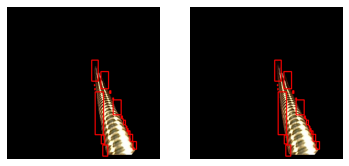

 GT feature extraction   Model feature extraction


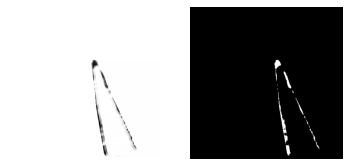

               Thresholded Difference 


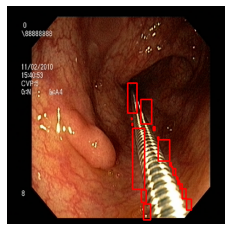

 Contour Box Feature Analysis
 
   1
SSIM multiple channel: 0.9962107704004343
SSIM: 0.9961766091557804


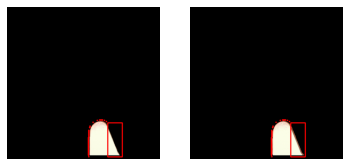

 GT feature extraction   Model feature extraction


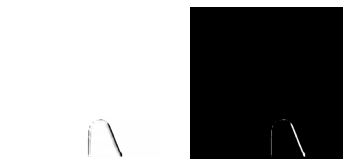

               Thresholded Difference 


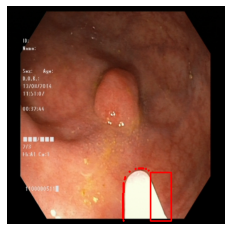

 Contour Box Feature Analysis
 
   2
SSIM multiple channel: 0.995262183971683
SSIM: 0.995125518212227


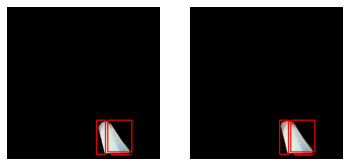

 GT feature extraction   Model feature extraction


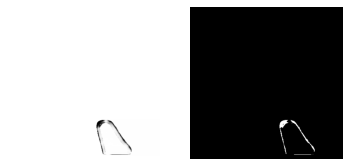

               Thresholded Difference 


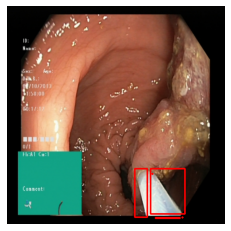

 Contour Box Feature Analysis
 
   3
SSIM multiple channel: 0.9890618565920127
SSIM: 0.9892378429051295


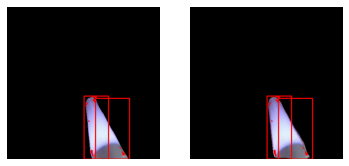

 GT feature extraction   Model feature extraction


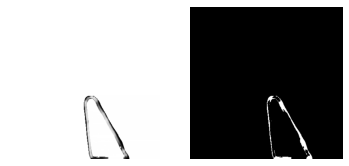

               Thresholded Difference 


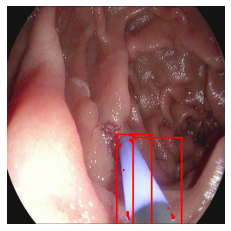

 Contour Box Feature Analysis
 
   4
SSIM multiple channel: 0.9979209194338057
SSIM: 0.9978844757329663


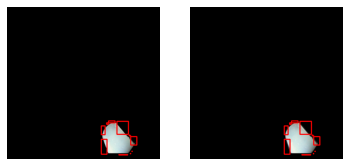

 GT feature extraction   Model feature extraction


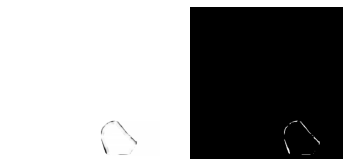

               Thresholded Difference 


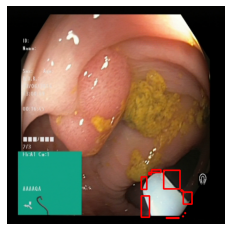

 Contour Box Feature Analysis
 
   5
SSIM multiple channel: 0.9682674861795547
SSIM: 0.9669029321319099


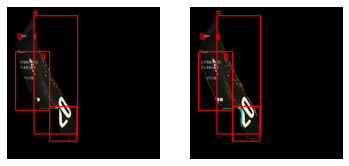

 GT feature extraction   Model feature extraction


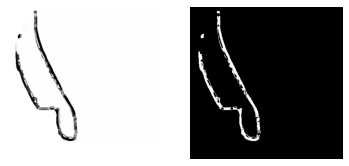

               Thresholded Difference 


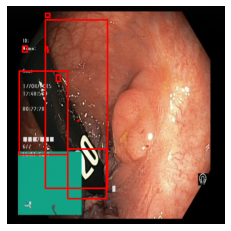

 Contour Box Feature Analysis
 
   6
SSIM multiple channel: 0.9671436867561004
SSIM: 0.9660892057360644


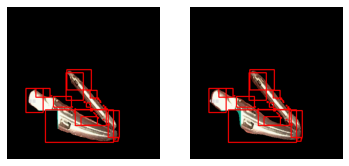

 GT feature extraction   Model feature extraction


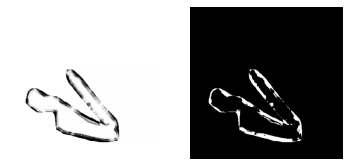

               Thresholded Difference 


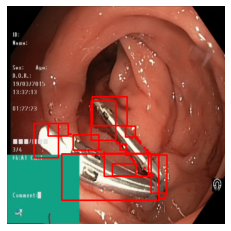

 Contour Box Feature Analysis
 
   7
SSIM multiple channel: 0.9922988890330612
SSIM: 0.9923669075204714


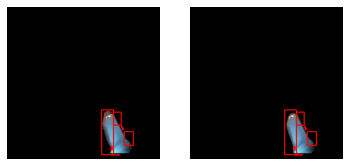

 GT feature extraction   Model feature extraction


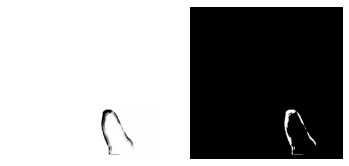

               Thresholded Difference 


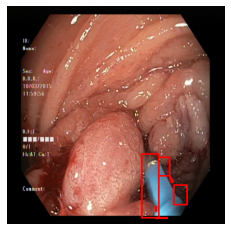

 Contour Box Feature Analysis
 
   8
SSIM multiple channel: 0.9934865781968213
SSIM: 0.9934337384216267


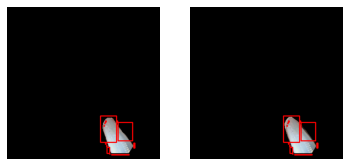

 GT feature extraction   Model feature extraction


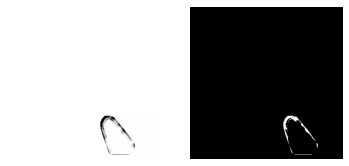

               Thresholded Difference 


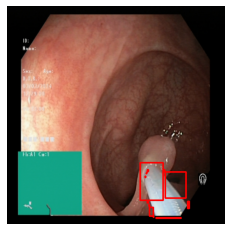

 Contour Box Feature Analysis
 
   9
SSIM multiple channel: 0.9811060133980481
SSIM: 0.9809769590575144


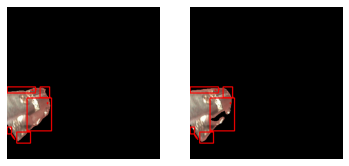

 GT feature extraction   Model feature extraction


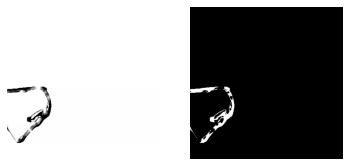

               Thresholded Difference 


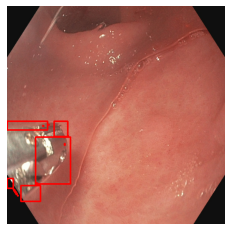

 Contour Box Feature Analysis
 
   10
SSIM multiple channel: 0.9953475609301118
SSIM: 0.9949234648280969


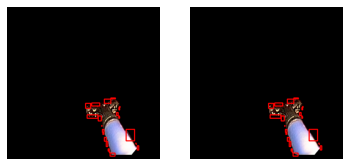

 GT feature extraction   Model feature extraction


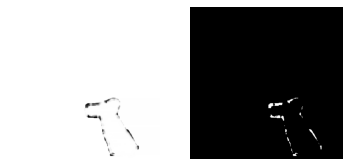

               Thresholded Difference 


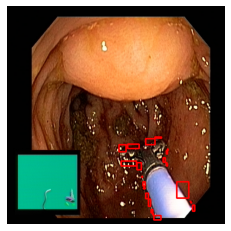

 Contour Box Feature Analysis
 
   11
SSIM multiple channel: 0.9938361362689822
SSIM: 0.9936522613858993


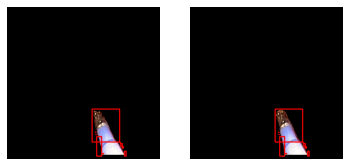

 GT feature extraction   Model feature extraction


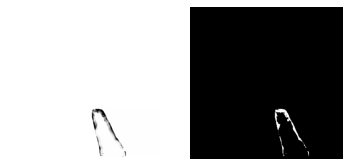

               Thresholded Difference 


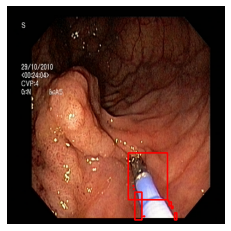

 Contour Box Feature Analysis
 
   12
SSIM multiple channel: 0.9928322643656194
SSIM: 0.9926047399375157


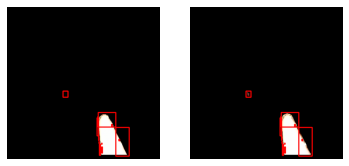

 GT feature extraction   Model feature extraction


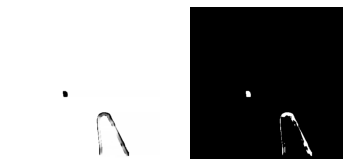

               Thresholded Difference 


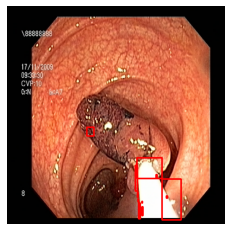

 Contour Box Feature Analysis
 
   13
SSIM multiple channel: 0.9605368439321468
SSIM: 0.9587850171579828


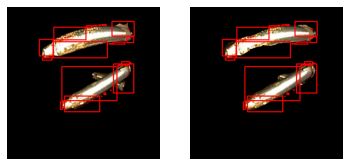

 GT feature extraction   Model feature extraction


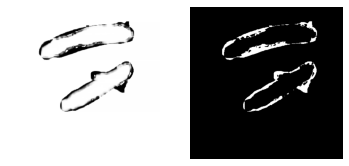

               Thresholded Difference 


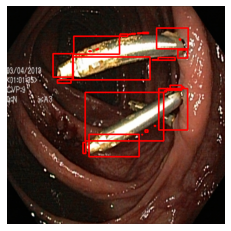

 Contour Box Feature Analysis
 
   14
SSIM multiple channel: 0.9929365769138983
SSIM: 0.9926735138980322


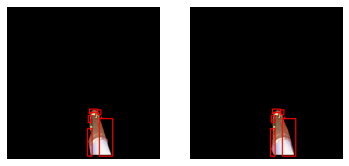

 GT feature extraction   Model feature extraction


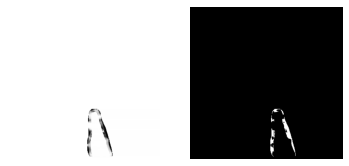

               Thresholded Difference 


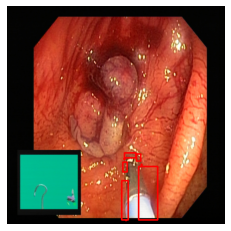

 Contour Box Feature Analysis
 
   15
SSIM multiple channel: 0.9976780999742653
SSIM: 0.9974023691851623


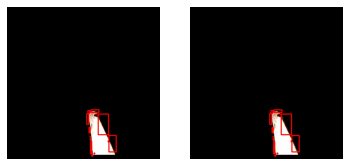

 GT feature extraction   Model feature extraction


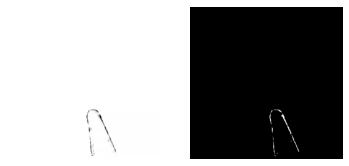

               Thresholded Difference 


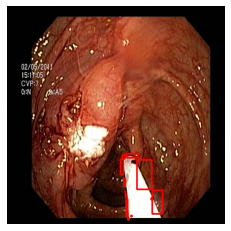

 Contour Box Feature Analysis
 
   16
SSIM multiple channel: 0.995785764140332
SSIM: 0.9954770482264589


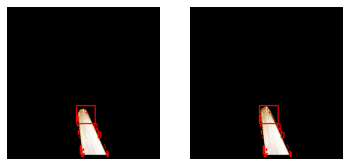

 GT feature extraction   Model feature extraction


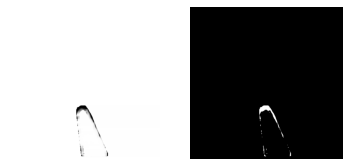

               Thresholded Difference 


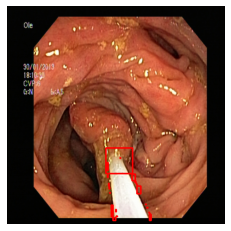

 Contour Box Feature Analysis
 
   17
SSIM multiple channel: 0.9948152999677483
SSIM: 0.9946951255716376


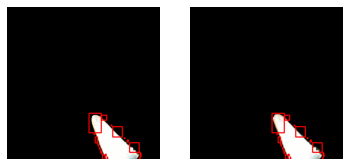

 GT feature extraction   Model feature extraction


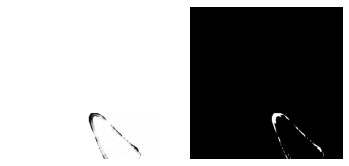

               Thresholded Difference 


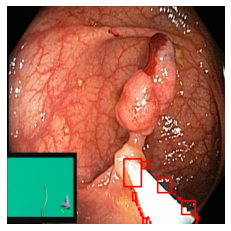

 Contour Box Feature Analysis
 
   18
SSIM multiple channel: 0.9970392162658772
SSIM: 0.9968839603223509


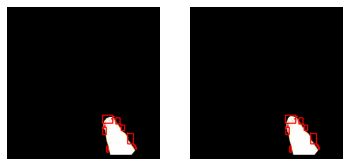

 GT feature extraction   Model feature extraction


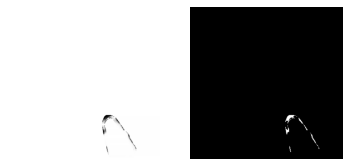

               Thresholded Difference 


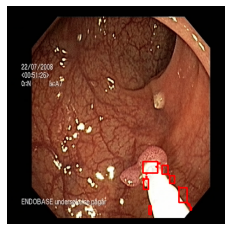

 Contour Box Feature Analysis
 
   19
SSIM multiple channel: 0.9957574647220401
SSIM: 0.9955597406880383


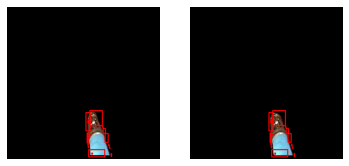

 GT feature extraction   Model feature extraction


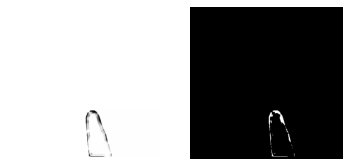

               Thresholded Difference 


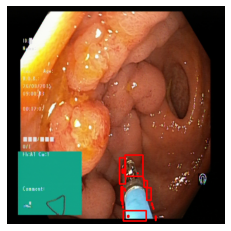

 Contour Box Feature Analysis
 
   20
SSIM multiple channel: 0.9942177972453825
SSIM: 0.9940791156927192


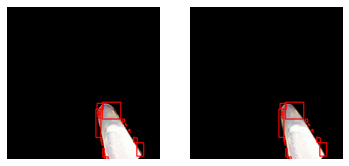

 GT feature extraction   Model feature extraction


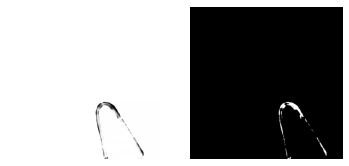

               Thresholded Difference 


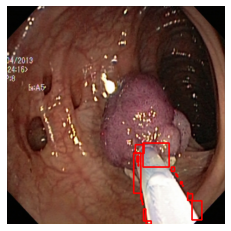

 Contour Box Feature Analysis
 
   21
SSIM multiple channel: 0.9901864286187981
SSIM: 0.9894162479436276


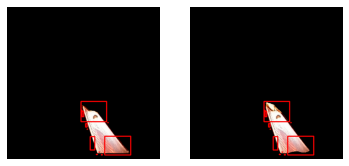

 GT feature extraction   Model feature extraction


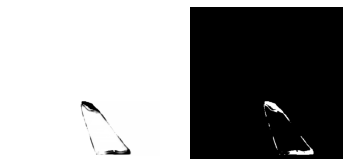

               Thresholded Difference 


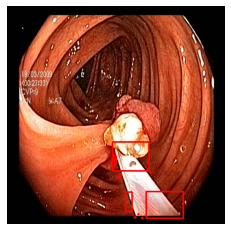

 Contour Box Feature Analysis
 
   22
SSIM multiple channel: 0.9645413221488868
SSIM: 0.964125116189385


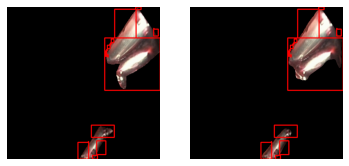

 GT feature extraction   Model feature extraction


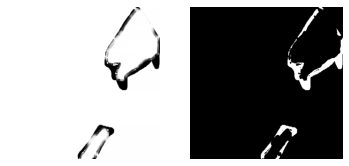

               Thresholded Difference 


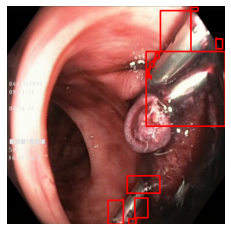

 Contour Box Feature Analysis
 
   23
SSIM multiple channel: 0.9968078673404306
SSIM: 0.9966115133008617


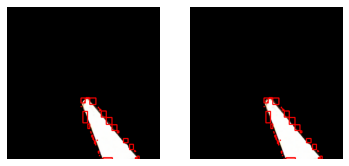

 GT feature extraction   Model feature extraction


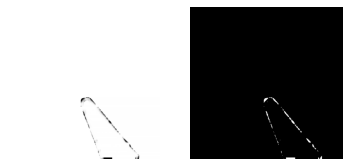

               Thresholded Difference 


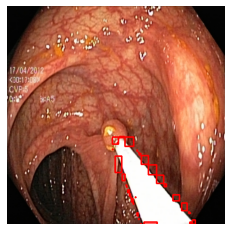

 Contour Box Feature Analysis
 
   24
SSIM multiple channel: 0.9953183065865409
SSIM: 0.995253507161134


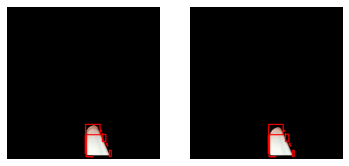

 GT feature extraction   Model feature extraction


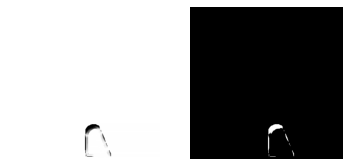

               Thresholded Difference 


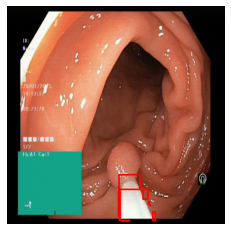

 Contour Box Feature Analysis
 
   25
SSIM multiple channel: 0.9912189138019866
SSIM: 0.990848981076846


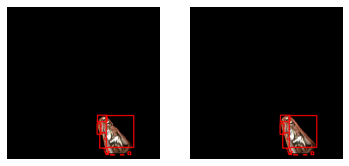

 GT feature extraction   Model feature extraction


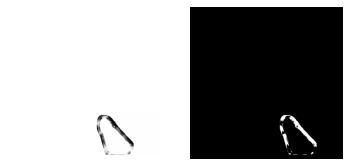

               Thresholded Difference 


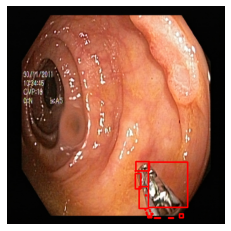

 Contour Box Feature Analysis
 
   26
SSIM multiple channel: 0.9962444318421487
SSIM: 0.9958151703001055


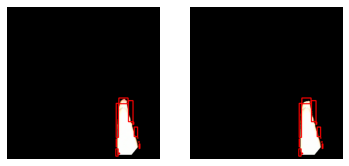

 GT feature extraction   Model feature extraction


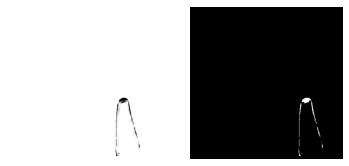

               Thresholded Difference 


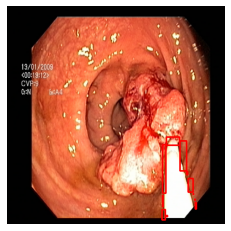

 Contour Box Feature Analysis
 
   27
SSIM multiple channel: 0.991550455804083
SSIM: 0.990681956099936


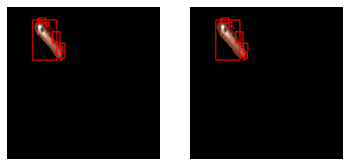

 GT feature extraction   Model feature extraction


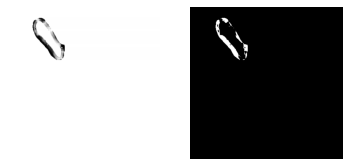

               Thresholded Difference 


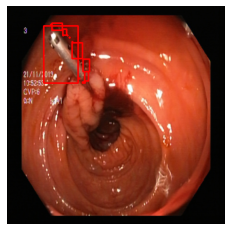

 Contour Box Feature Analysis
 
   28
SSIM multiple channel: 0.9928882027673328
SSIM: 0.9928082784790074


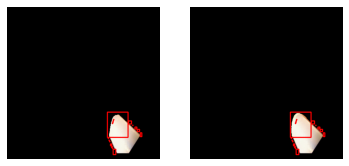

 GT feature extraction   Model feature extraction


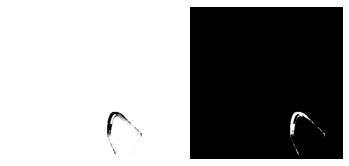

               Thresholded Difference 


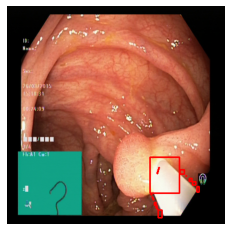

 Contour Box Feature Analysis
 
   29
SSIM multiple channel: 0.9784440938007407
SSIM: 0.9782931877720498


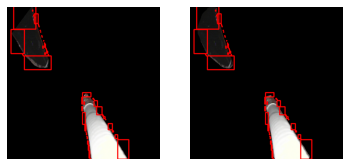

 GT feature extraction   Model feature extraction


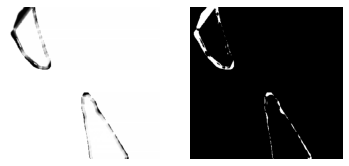

               Thresholded Difference 


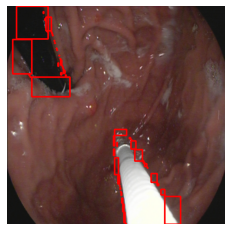

 Contour Box Feature Analysis
 
   30
SSIM multiple channel: 0.9882256861924864
SSIM: 0.9880036124058771


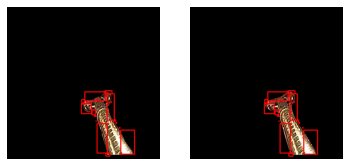

 GT feature extraction   Model feature extraction


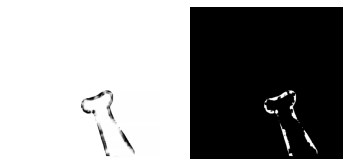

               Thresholded Difference 


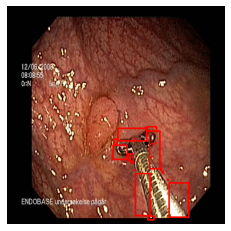

 Contour Box Feature Analysis
 
   31
SSIM multiple channel: 0.9431306929221791
SSIM: 0.9426330454377446


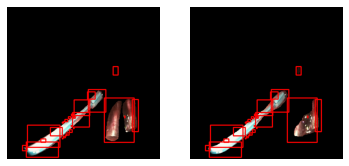

 GT feature extraction   Model feature extraction


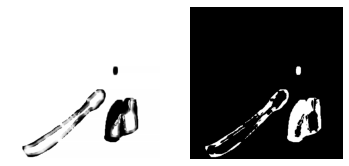

               Thresholded Difference 


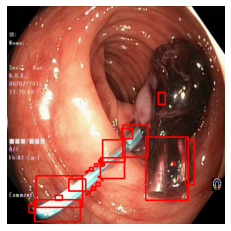

 Contour Box Feature Analysis
 
   32
SSIM multiple channel: 0.9939115295698007
SSIM: 0.9937471044132155


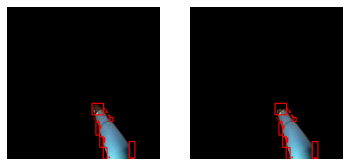

 GT feature extraction   Model feature extraction


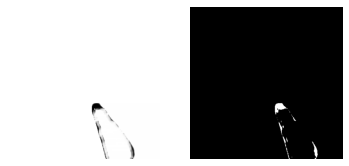

               Thresholded Difference 


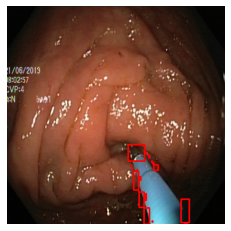

 Contour Box Feature Analysis
 
   33
SSIM multiple channel: 0.9899362507482335
SSIM: 0.9897448957633842


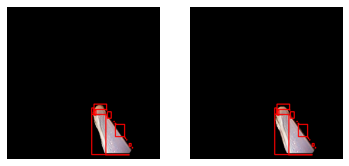

 GT feature extraction   Model feature extraction


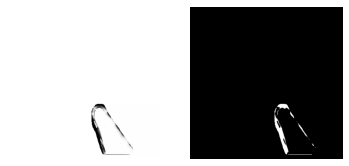

               Thresholded Difference 


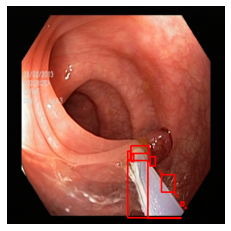

 Contour Box Feature Analysis
 
   34
SSIM multiple channel: 0.8064087982408191
SSIM: 0.8063367491230041


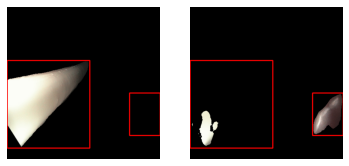

 GT feature extraction   Model feature extraction


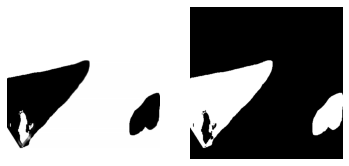

               Thresholded Difference 


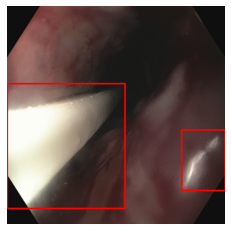

 Contour Box Feature Analysis
 
   35
SSIM multiple channel: 0.9888443602500795
SSIM: 0.988284367898887


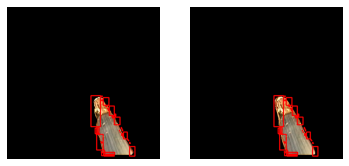

 GT feature extraction   Model feature extraction


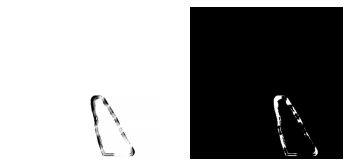

               Thresholded Difference 


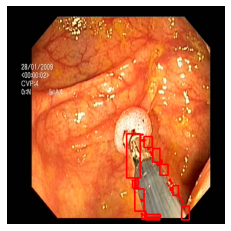

 Contour Box Feature Analysis
 
   36
SSIM multiple channel: 0.9913568493746611
SSIM: 0.9902903147465411


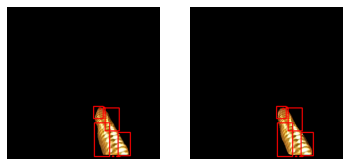

 GT feature extraction   Model feature extraction


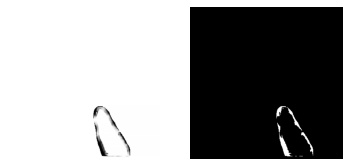

               Thresholded Difference 


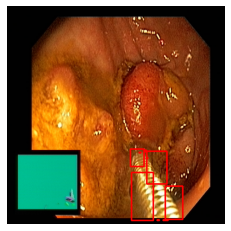

 Contour Box Feature Analysis
 
   37
SSIM multiple channel: 0.9550187364581696
SSIM: 0.9538928480989545


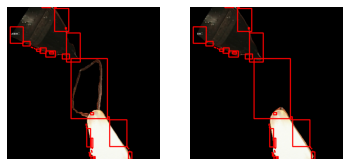

 GT feature extraction   Model feature extraction


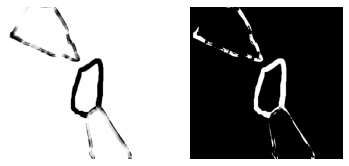

               Thresholded Difference 


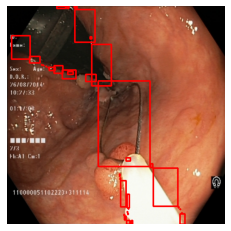

 Contour Box Feature Analysis
 
   38
SSIM multiple channel: 0.9874932814163576
SSIM: 0.9872685799185188


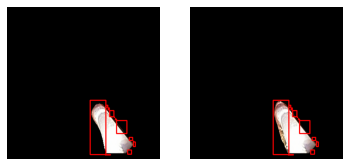

 GT feature extraction   Model feature extraction


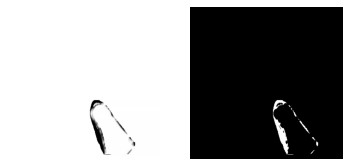

               Thresholded Difference 


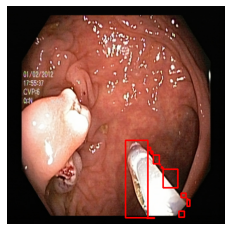

 Contour Box Feature Analysis
 
   39
SSIM multiple channel: 0.9952068980077899
SSIM: 0.9950587435126854


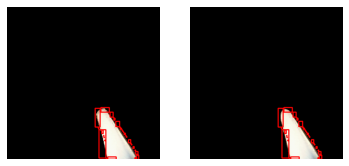

 GT feature extraction   Model feature extraction


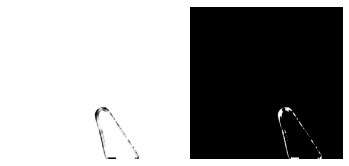

               Thresholded Difference 


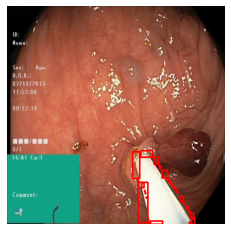

 Contour Box Feature Analysis
 
   40
SSIM multiple channel: 0.9930153659707281
SSIM: 0.9930585317948339


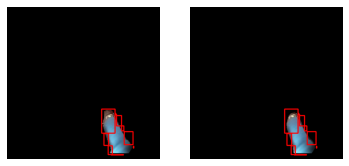

 GT feature extraction   Model feature extraction


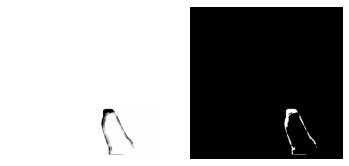

               Thresholded Difference 


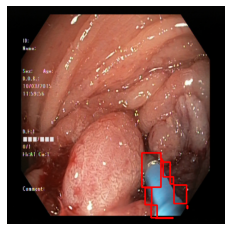

 Contour Box Feature Analysis
 
   41
SSIM multiple channel: 0.9813247486025695
SSIM: 0.9808621798830823


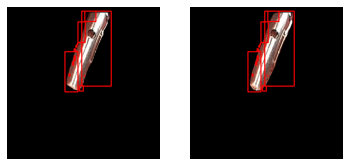

 GT feature extraction   Model feature extraction


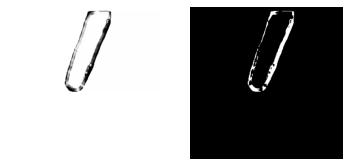

               Thresholded Difference 


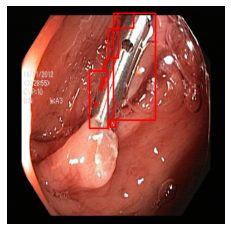

 Contour Box Feature Analysis
 
   42
SSIM multiple channel: 0.9871130430512665
SSIM: 0.9871812985630757


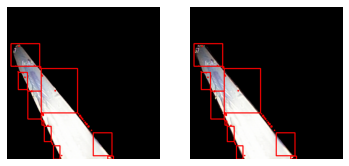

 GT feature extraction   Model feature extraction


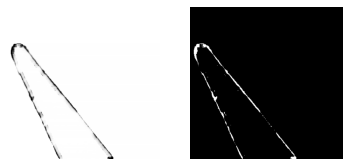

               Thresholded Difference 


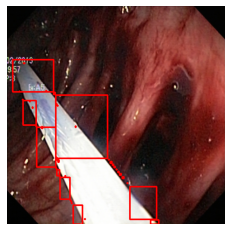

 Contour Box Feature Analysis
 
   43
SSIM multiple channel: 0.9944966553599593
SSIM: 0.9943529231321588


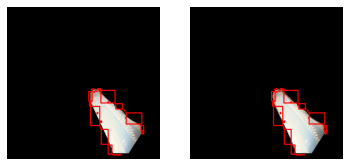

 GT feature extraction   Model feature extraction


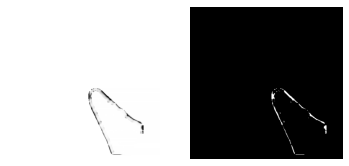

               Thresholded Difference 


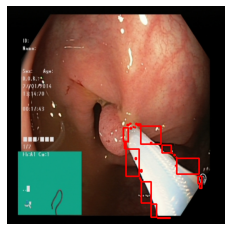

 Contour Box Feature Analysis
 
   44
SSIM multiple channel: 0.9505568543752295
SSIM: 0.9500774244771071


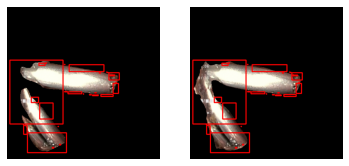

 GT feature extraction   Model feature extraction


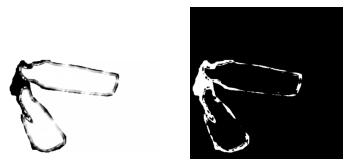

               Thresholded Difference 


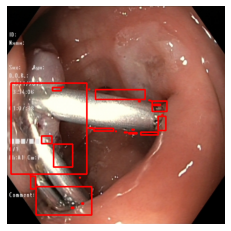

 Contour Box Feature Analysis
 
   45
SSIM multiple channel: 0.9968246121956811
SSIM: 0.9960172525491974


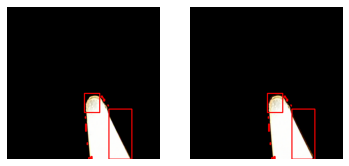

 GT feature extraction   Model feature extraction


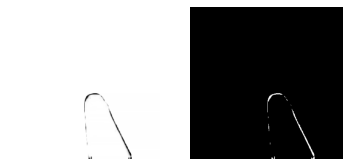

               Thresholded Difference 


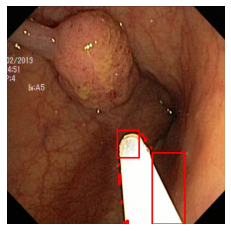

 Contour Box Feature Analysis
 
   46
SSIM multiple channel: 0.9957331717571987
SSIM: 0.9954922342722781


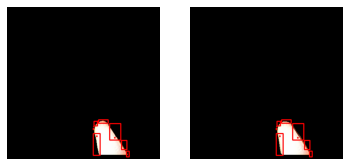

 GT feature extraction   Model feature extraction


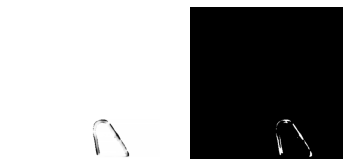

               Thresholded Difference 


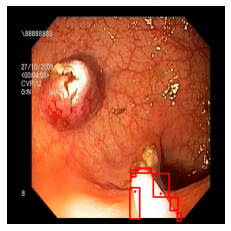

 Contour Box Feature Analysis
 
   47
SSIM multiple channel: 0.997593323244197
SSIM: 0.9972957397961845


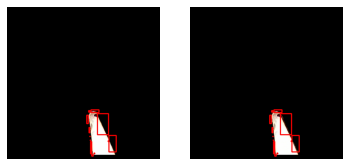

 GT feature extraction   Model feature extraction


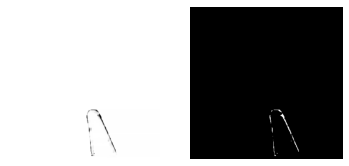

               Thresholded Difference 


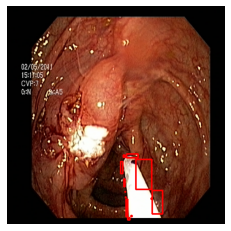

 Contour Box Feature Analysis
 
   48
SSIM multiple channel: 0.98843369647182
SSIM: 0.9884077811843599


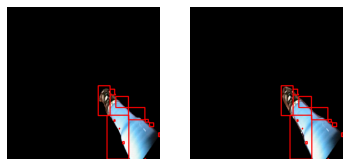

 GT feature extraction   Model feature extraction


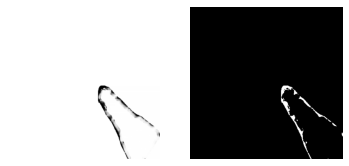

               Thresholded Difference 


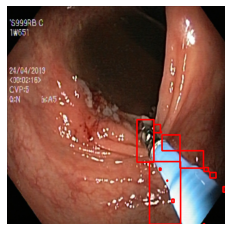

 Contour Box Feature Analysis
 
   49
SSIM multiple channel: 0.9047603331460707
SSIM: 0.9046914301089373


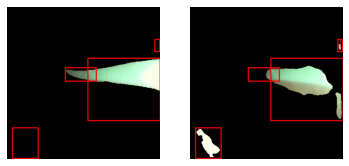

 GT feature extraction   Model feature extraction


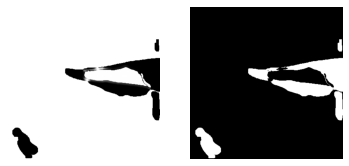

               Thresholded Difference 


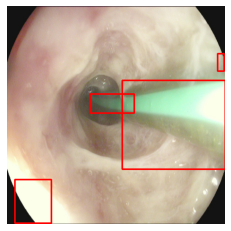

 Contour Box Feature Analysis
 
   50
SSIM multiple channel: 0.9923929432237152
SSIM: 0.992090704966435


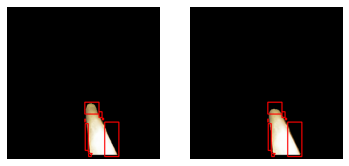

 GT feature extraction   Model feature extraction


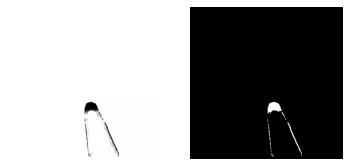

               Thresholded Difference 


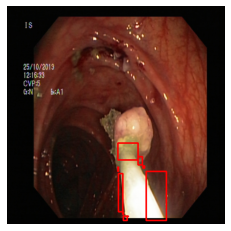

 Contour Box Feature Analysis
 
   51
SSIM multiple channel: 0.9508914319536411
SSIM: 0.9504049423207526


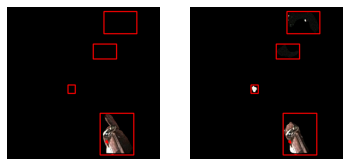

 GT feature extraction   Model feature extraction


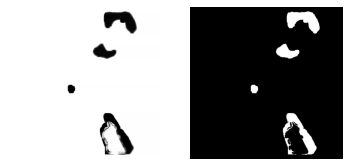

               Thresholded Difference 


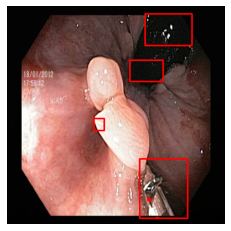

 Contour Box Feature Analysis
 
   52
SSIM multiple channel: 0.9920062089268944
SSIM: 0.9922038515283637


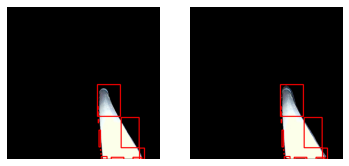

 GT feature extraction   Model feature extraction


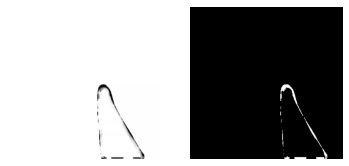

               Thresholded Difference 


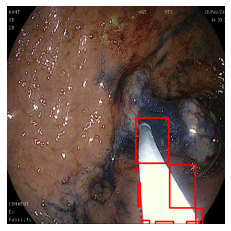

 Contour Box Feature Analysis
 
   53
SSIM multiple channel: 0.9931969474988152
SSIM: 0.991885969154275


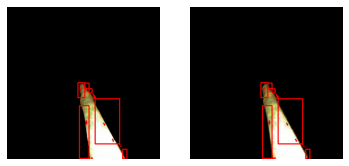

 GT feature extraction   Model feature extraction


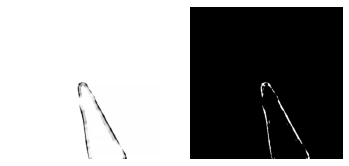

               Thresholded Difference 


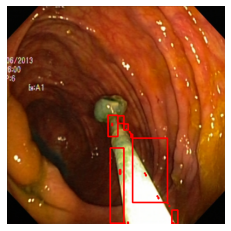

 Contour Box Feature Analysis
 
   54
SSIM multiple channel: 0.9889331752836575
SSIM: 0.9883806777524602


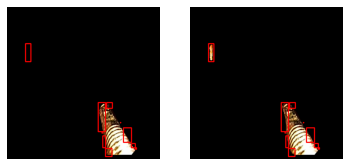

 GT feature extraction   Model feature extraction


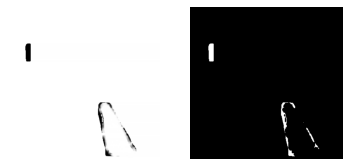

               Thresholded Difference 


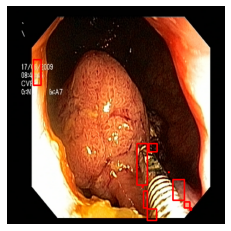

 Contour Box Feature Analysis
 
   55
SSIM multiple channel: 0.9961154119847153
SSIM: 0.9960460986409485


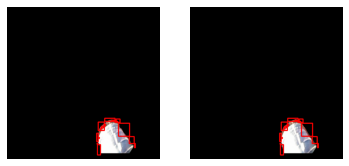

 GT feature extraction   Model feature extraction


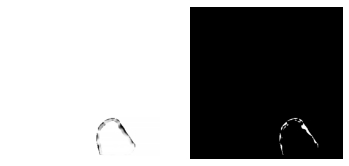

               Thresholded Difference 


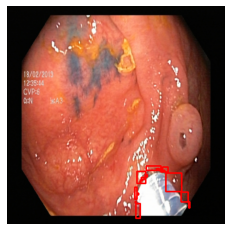

 Contour Box Feature Analysis
 
   56
SSIM multiple channel: 0.9823229937248302
SSIM: 0.9818226978841254


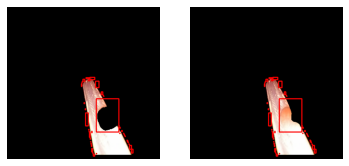

 GT feature extraction   Model feature extraction


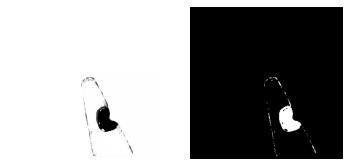

               Thresholded Difference 


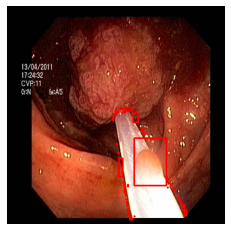

 Contour Box Feature Analysis
 
   57
SSIM multiple channel: 0.9942442941090022
SSIM: 0.9941750115967998


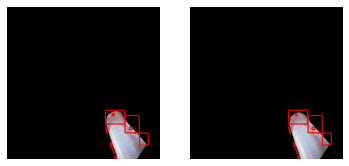

 GT feature extraction   Model feature extraction


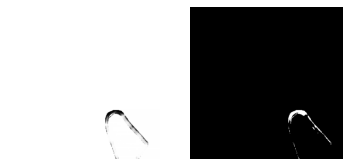

               Thresholded Difference 


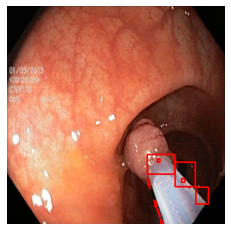

 Contour Box Feature Analysis
 
   58
SSIM multiple channel: 0.9912069099873895
SSIM: 0.9908750173041124


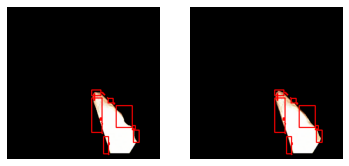

 GT feature extraction   Model feature extraction


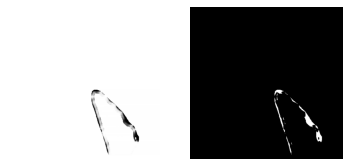

               Thresholded Difference 


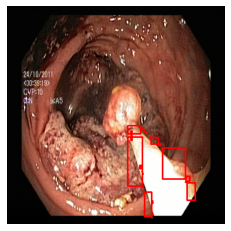

 Contour Box Feature Analysis
 
   59
SSIM multiple channel: 0.9973631664548005
SSIM: 0.996696801675272


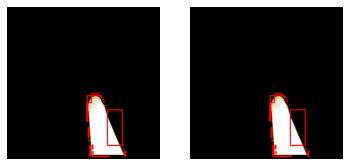

 GT feature extraction   Model feature extraction


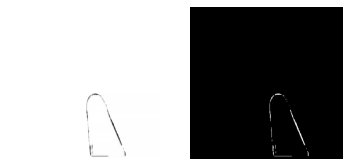

               Thresholded Difference 


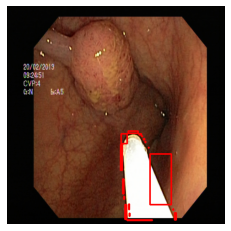

 Contour Box Feature Analysis
 
   60
SSIM multiple channel: 0.9799894080886821
SSIM: 0.9797250534848284


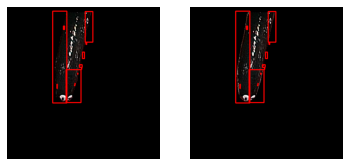

 GT feature extraction   Model feature extraction


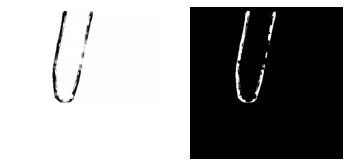

               Thresholded Difference 


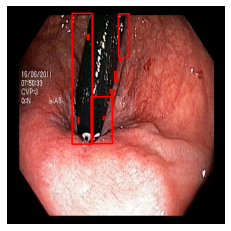

 Contour Box Feature Analysis
 
   61
SSIM multiple channel: 0.9707776981629124
SSIM: 0.9700772884214285


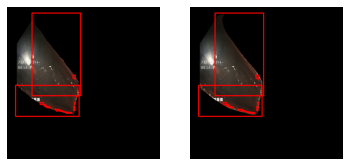

 GT feature extraction   Model feature extraction


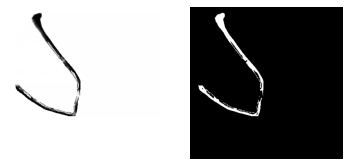

               Thresholded Difference 


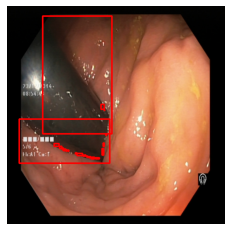

 Contour Box Feature Analysis
 
   62
SSIM multiple channel: 0.9675004194403541
SSIM: 0.9672088273736127


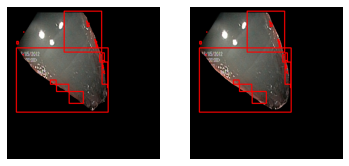

 GT feature extraction   Model feature extraction


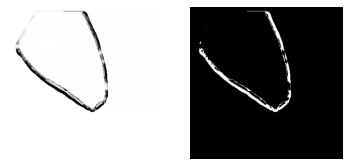

               Thresholded Difference 


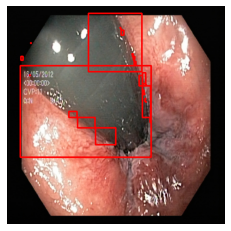

 Contour Box Feature Analysis
 
   63
SSIM multiple channel: 0.985176765943807
SSIM: 0.9845784793369442


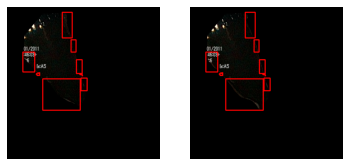

 GT feature extraction   Model feature extraction


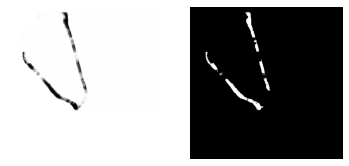

               Thresholded Difference 


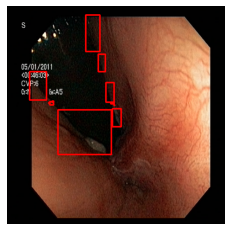

 Contour Box Feature Analysis
 
   64
SSIM multiple channel: 0.9781267921952344
SSIM: 0.9777849465071613


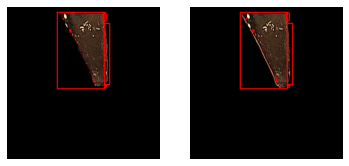

 GT feature extraction   Model feature extraction


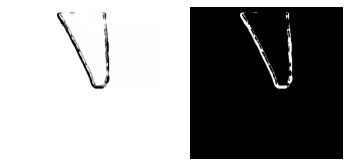

               Thresholded Difference 


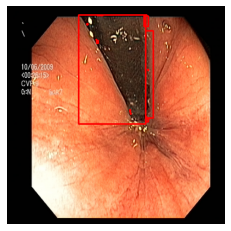

 Contour Box Feature Analysis
 
   65
SSIM multiple channel: 0.9810326128322027
SSIM: 0.9798055527644094


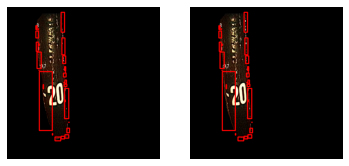

 GT feature extraction   Model feature extraction


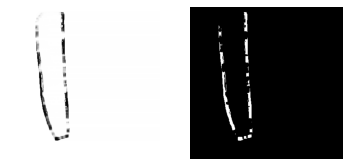

               Thresholded Difference 


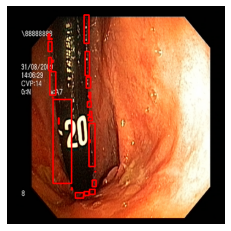

 Contour Box Feature Analysis
 
   66
SSIM multiple channel: 0.9806540061638361
SSIM: 0.980252526426851


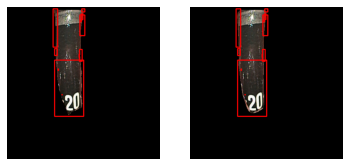

 GT feature extraction   Model feature extraction


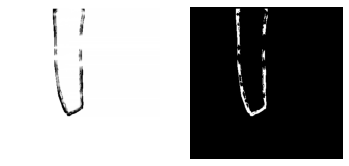

               Thresholded Difference 


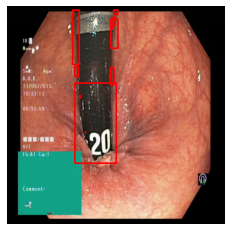

 Contour Box Feature Analysis
 
   67
SSIM multiple channel: 0.9855136826037199
SSIM: 0.9831548291867609


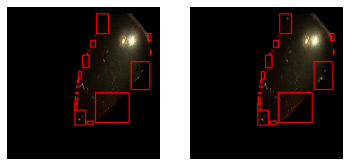

 GT feature extraction   Model feature extraction


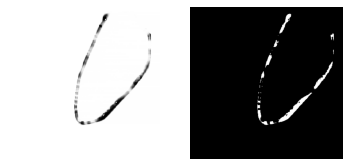

               Thresholded Difference 


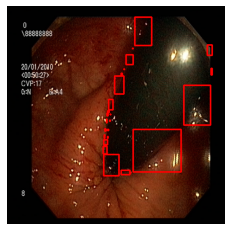

 Contour Box Feature Analysis
 
   68
SSIM multiple channel: 0.9851508705006352
SSIM: 0.9847837770350026


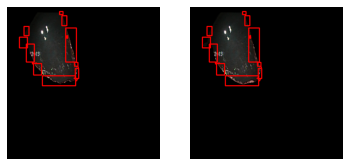

 GT feature extraction   Model feature extraction


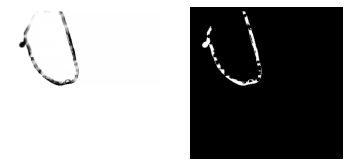

               Thresholded Difference 


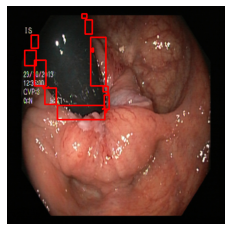

 Contour Box Feature Analysis
 
   69
SSIM multiple channel: 0.9435645605296984
SSIM: 0.9432436099877115


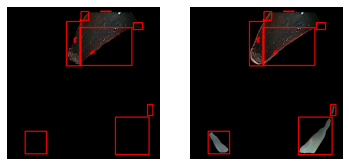

 GT feature extraction   Model feature extraction


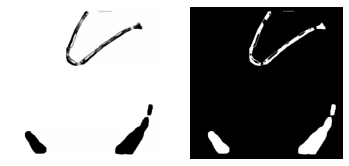

               Thresholded Difference 


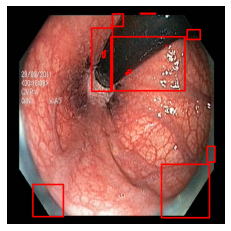

 Contour Box Feature Analysis
 
   70
SSIM multiple channel: 0.9818005462804038
SSIM: 0.9808489011526301


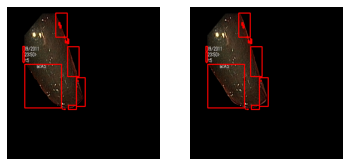

 GT feature extraction   Model feature extraction


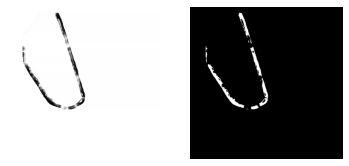

               Thresholded Difference 


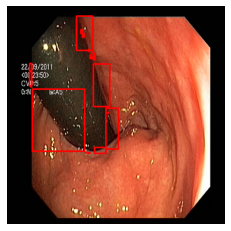

 Contour Box Feature Analysis
 
   71
SSIM multiple channel: 0.9784641919220789
SSIM: 0.9781566686675947


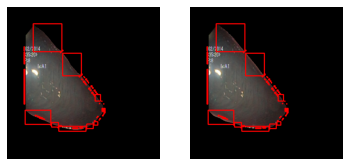

 GT feature extraction   Model feature extraction


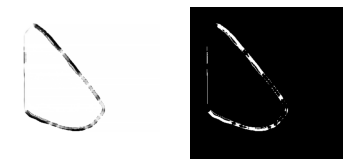

               Thresholded Difference 


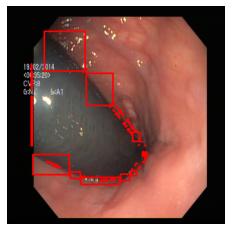

 Contour Box Feature Analysis
 
   72
SSIM multiple channel: 0.9889555917075826
SSIM: 0.9887926072030333


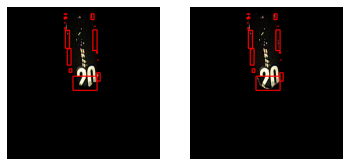

 GT feature extraction   Model feature extraction


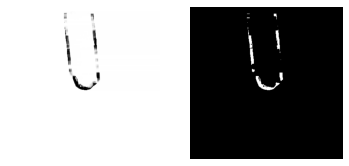

               Thresholded Difference 


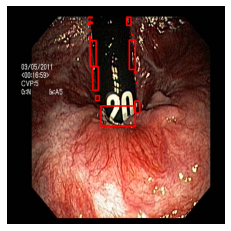

 Contour Box Feature Analysis
 
   73
SSIM multiple channel: 0.9777194200634179
SSIM: 0.9760312473669631


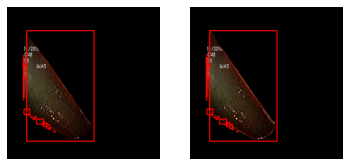

 GT feature extraction   Model feature extraction


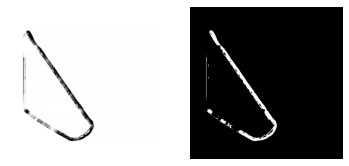

               Thresholded Difference 


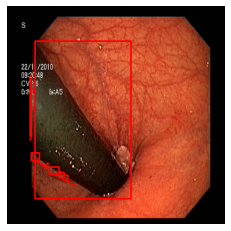

 Contour Box Feature Analysis
 
   74
SSIM multiple channel: 0.9847544721458158
SSIM: 0.9837588089382339


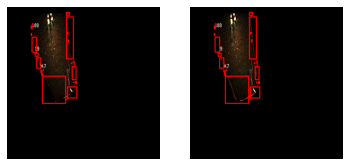

 GT feature extraction   Model feature extraction


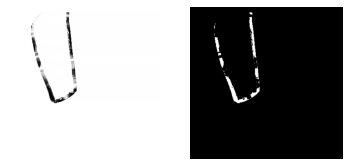

               Thresholded Difference 


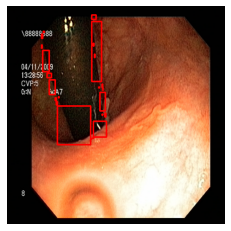

 Contour Box Feature Analysis
 
   75
SSIM multiple channel: 0.9797091195056363
SSIM: 0.9777381548258034


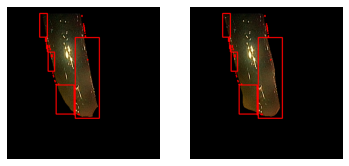

 GT feature extraction   Model feature extraction


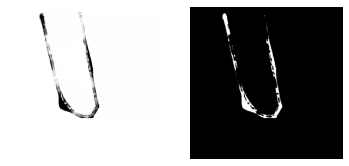

               Thresholded Difference 


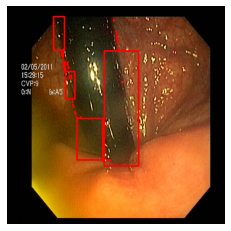

 Contour Box Feature Analysis
 
   76
SSIM multiple channel: 0.9858066790862852
SSIM: 0.9854753584006439


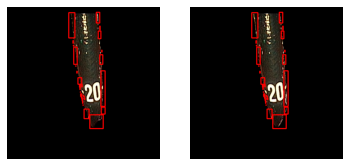

 GT feature extraction   Model feature extraction


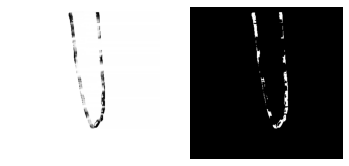

               Thresholded Difference 


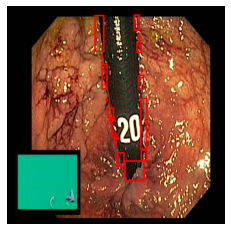

 Contour Box Feature Analysis
 
   77
SSIM multiple channel: 0.9820355703678079
SSIM: 0.9815468788702417


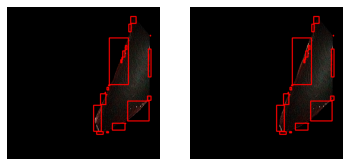

 GT feature extraction   Model feature extraction


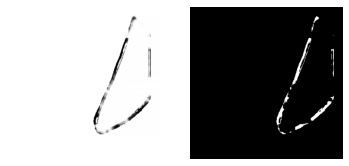

               Thresholded Difference 


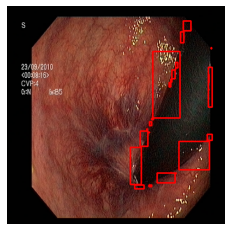

 Contour Box Feature Analysis
 
   78
SSIM multiple channel: 0.983943916672482
SSIM: 0.9836458835083801


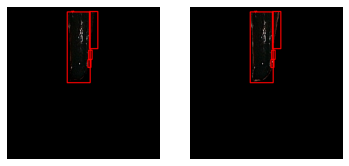

 GT feature extraction   Model feature extraction


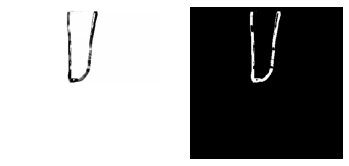

               Thresholded Difference 


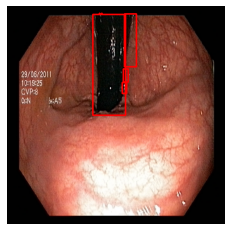

 Contour Box Feature Analysis
 
   79
SSIM multiple channel: 0.9824920108063863
SSIM: 0.9813304075906817


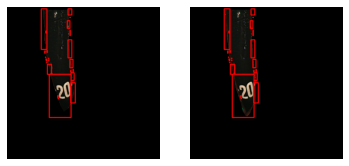

 GT feature extraction   Model feature extraction


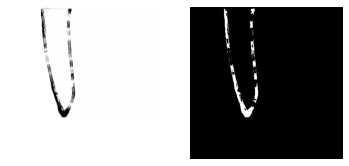

               Thresholded Difference 


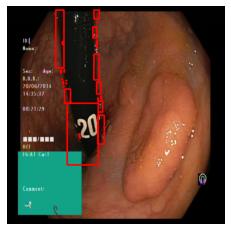

 Contour Box Feature Analysis
 
   80
SSIM multiple channel: 0.9750241037255384
SSIM: 0.9740909896090987


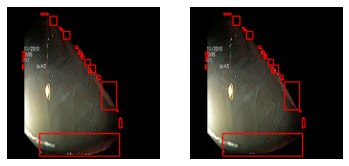

 GT feature extraction   Model feature extraction


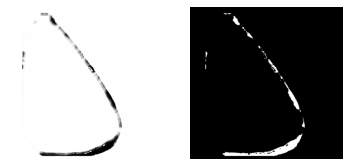

               Thresholded Difference 


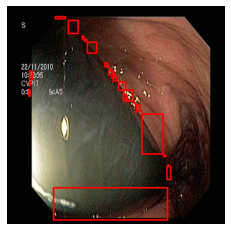

 Contour Box Feature Analysis
 
   81
SSIM multiple channel: 0.9916864012465854
SSIM: 0.9907369386361197


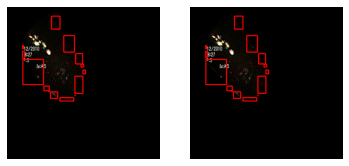

 GT feature extraction   Model feature extraction


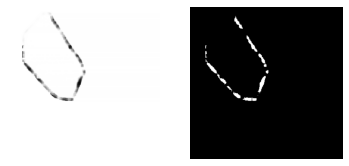

               Thresholded Difference 


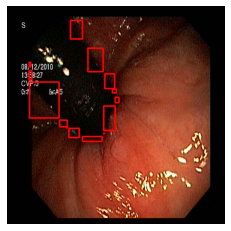

 Contour Box Feature Analysis
 
   82
SSIM multiple channel: 0.9851616331472175
SSIM: 0.9840165997393703


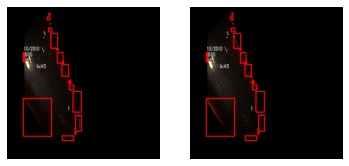

 GT feature extraction   Model feature extraction


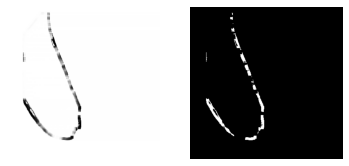

               Thresholded Difference 


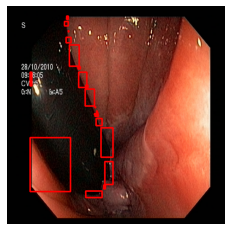

 Contour Box Feature Analysis
 
   83
SSIM multiple channel: 0.97899110772506
SSIM: 0.9771235472794884


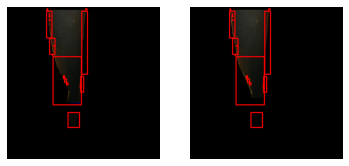

 GT feature extraction   Model feature extraction


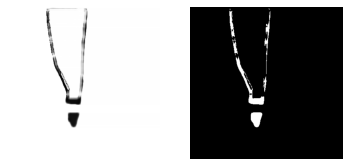

               Thresholded Difference 


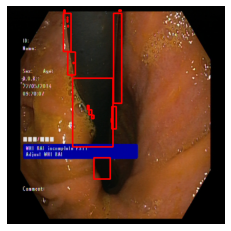

 Contour Box Feature Analysis
 
   84
SSIM multiple channel: 0.9889029028093277
SSIM: 0.988603817596375


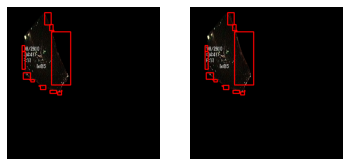

 GT feature extraction   Model feature extraction


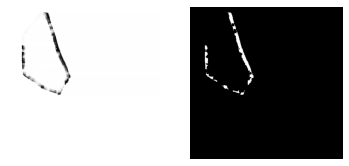

               Thresholded Difference 


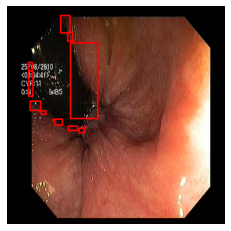

 Contour Box Feature Analysis
 
   85
SSIM multiple channel: 0.9865269507005907
SSIM: 0.9861318440431025


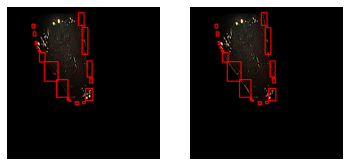

 GT feature extraction   Model feature extraction


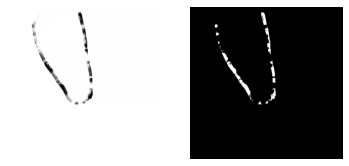

               Thresholded Difference 


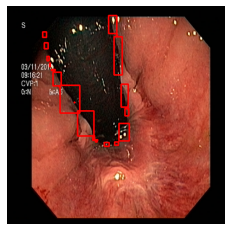

 Contour Box Feature Analysis
 
   86
SSIM multiple channel: 0.9929862255457289
SSIM: 0.9925547735683642


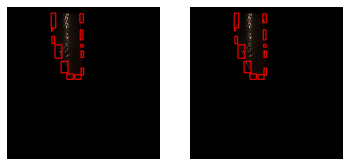

 GT feature extraction   Model feature extraction


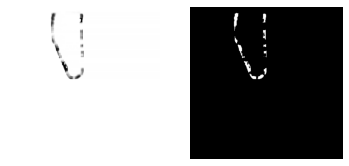

               Thresholded Difference 


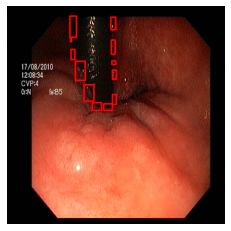

 Contour Box Feature Analysis
 
   87
SSIM multiple channel: 0.9862068533228401
SSIM: 0.9859582057056261


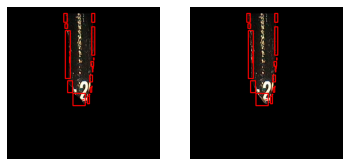

 GT feature extraction   Model feature extraction


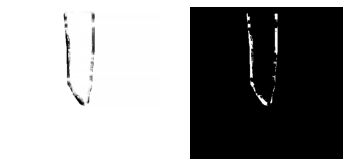

               Thresholded Difference 


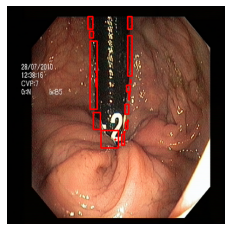

 Contour Box Feature Analysis
 
   88
SSIM multiple channel: 0.9786814775600513
SSIM: 0.9782775351574511


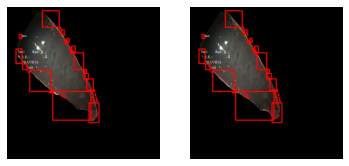

 GT feature extraction   Model feature extraction


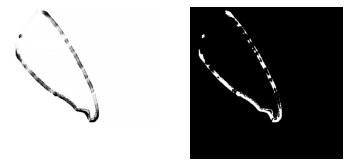

               Thresholded Difference 


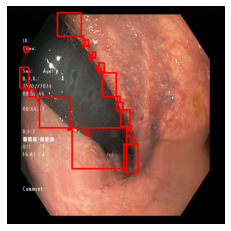

 Contour Box Feature Analysis
 
   89
SSIM multiple channel: 0.9763967659662809
SSIM: 0.9755462211108276


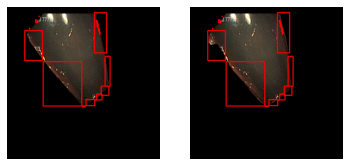

 GT feature extraction   Model feature extraction


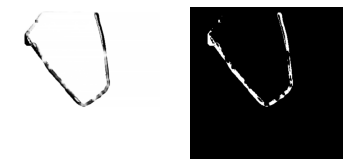

               Thresholded Difference 


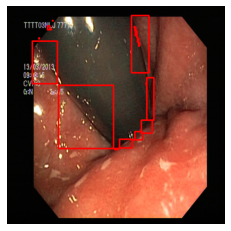

 Contour Box Feature Analysis
 


In [17]:
# """""""" VALIDATION """"""""""""""""""""""""""
import os    
os.environ['KMP_DUPLICATE_LIB_OK']='True'
def matplotlib_imshow(display_list):
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.imshow(display_list[i])
        plt.axis('off')
    plt.show()

import matplotlib.pyplot as plt

# import numpy
CUDA_LAUNCH_BLOCKING=1
los=0
kb=0
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'
transform_img = transforms.Compose([ 
    transforms.ToTensor()]);
kb=los
los=0
fs=0
p=0
pre=0
rec=0
di=0
with torch.no_grad():
  correct = 0;
  total = 0;
  UNET.eval()
  import cv2
  def _fast_hist(label_pred, label_true, n_class):
      mask = (label_true >= 0) & (label_true < n_class)
      hist = np.bincount(
          n_class * label_true[mask].astype(int) + label_pred[mask], minlength=n_class ** 2
      ).reshape(n_class, n_class)
      return hist


  def evaluate(predictions, gts, num_classes):
      hist = np.zeros((num_classes, num_classes))
      for lp, lt in zip(predictions, gts):
          hist += _fast_hist(lp.flatten(), lt.flatten(), num_classes)
      
      iu = np.diag(hist) / (hist.sum(axis=1) + hist.sum(axis=0) - np.diag(hist))
      mean_iu = np.nanmean(iu)
      
      return mean_iu

  for i, data in enumerate(val_loader):
      print('  ',i)
      inputs, labels,tes = data;
      inputs = inputs.to(device);

      outputs = UNET.forward(inputs);
      inputs=inputs.squeeze(0)
      inputs= np.array(inputs.cpu())
      inputs = inputs.reshape(size,size,3)
      outputs = corr(outputs);
      labels = labels.detach().numpy();
      outputs = outputs.reshape(1, size, size);
      correct=correct+1

      color_pred=labels[0]
      d1,a1,b1 =labels[0].shape
      
      color_pre=outputs
      
      dd,aa,bb = color_pre.shape
      d1,a1,b1 =labels[0].shape

      color_pre=np.array(color_pre).reshape(aa,bb)


      color_pre=visualize_prediction(color_pre)
      img = cv2.resize(color_pre, (a1,d1))
      inputs = cv2.resize(inputs, (a1,d1))
      inputs=inputs
      color_preds=copy.deepcopy(color_pred)
      if 1==1:

        tes=tes.squeeze(0)

        tes=np.array(tes.cpu())
        import copy
        tes1=copy.deepcopy(tes)

        
      if 1==1:
        outputs=outputs.reshape(400,400,1)
        ig4=outputs
        outputss=np.concatenate((ig4,ig4,ig4),axis=2)
        tes2=tes1*outputss
        color_pred = cv2.resize(color_pred, (400,400))
        imgx = cv2.cvtColor(color_pred, cv2.COLOR_BGR2GRAY);


        imgx = class_pixel(imgx)
        ig44=imgx
        outputsss=np.concatenate((ig44,ig44,ig44),axis=2)

        tes3=tes1*outputsss
        outputs=outputs.squeeze(2)
        imgx=imgx.squeeze(2)
        aeg=visualize_prediction3(outputs,imgx)
        tes4=tes1*aeg

        psnrs = []
        ssims = []
        imgA= np.array(tes3, dtype=np.uint8)
        imgB= np.array(tes2, dtype=np.uint8)
        imgC= np.array(tes1, dtype=np.uint8)


        (score1, diff1) = structural_similarity(imgA,imgB, full=True, multichannel=True)
        diff1 = (diff1 * 255).astype("uint8")
        print("SSIM multiple channel: {}".format(score1))
        grayA = cv2.cvtColor(imgA, cv2.COLOR_BGR2GRAY)
        grayB = cv2.cvtColor(imgB, cv2.COLOR_BGR2GRAY) 
        (score2, diff2) = structural_similarity(grayA, grayB, full=True)
        diff2 = (diff2 * 255).astype("uint8")
        print("SSIM: {}".format(score2))
        diff=diff2

        thresh = cv2.threshold(diff,0,255,
        cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
        cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE)
        cnts = cnts[0] 

        for c in cnts:
          # print(cv2.boundingRect(c))

        # compute the bounding box of the contour and then draw the
        # bounding box on both input images to represent where the two
        # images differ
            
          (x, y, w, h) = cv2.boundingRect(c)
          cv2.rectangle(imgA, (x, y), (x + w, y + h), (0, 0, 255), 2)
          cv2.rectangle(imgB, (x, y), (x + w, y + h), (0, 0, 255), 2)
          cv2.rectangle(imgC, (x, y), (x + w, y + h), (0, 0, 255), 2)

        show=True
        if True:
#             cv2.imshow('Lena Soderberg',imgA)
#             cv2.imwrite('result/'+'imgA'+'.jpg',imgA)
#             cv2.imwrite('result/'+'imgB'+'.jpg',imgB)
#             cv2.imwrite('result/'+'imgC'+'.jpg',imgC)
#             cv2.imwrite('result/'+'diff'+'.jpg',diff)
#             cv2.imwrite('result/'+'thresh'+'.jpg',thresh
            imgA=cv2.cvtColor(imgA, cv2.COLOR_BGR2RGB);
            imgB=cv2.cvtColor(imgB, cv2.COLOR_BGR2RGB);
            imgC=cv2.cvtColor(imgC, cv2.COLOR_BGR2RGB);
            diff=cv2.cvtColor(diff, cv2.COLOR_BGR2RGB);
            thresh=cv2.cvtColor(thresh, cv2.COLOR_BGR2RGB);
            matplotlib_imshow([imgA,imgB])
            print(' GT feature extraction   Model feature extraction')
            
            
            matplotlib_imshow([diff,thresh])
            
            print('               Thresholded Difference ')
            matplotlib_imshow([imgC])
            
            print(' Contour Box Feature Analysis')
            print(' ')
            
            

            

     

      

# Counterfactual results for generated images